In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
mushroom = fetch_ucirepo(id=73) 
X = mushroom.data.features 
y = mushroom.data.targets 
  
# metadata 
print(mushroom.metadata) 
  
print(mushroom.variables) 

{'uci_id': 73, 'name': 'Mushroom', 'repository_url': 'https://archive.ics.uci.edu/dataset/73/mushroom', 'data_url': 'https://archive.ics.uci.edu/static/public/73/data.csv', 'abstract': 'From Audobon Society Field Guide; mushrooms described in terms of physical characteristics; classification: poisonous or edible', 'area': 'Biology', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 8124, 'num_features': 22, 'feature_types': ['Categorical'], 'demographics': [], 'target_col': ['poisonous'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1981, 'last_updated': 'Thu Aug 10 2023', 'dataset_doi': '10.24432/C5959T', 'creators': [], 'intro_paper': None, 'additional_info': {'summary': "This data set includes descriptions of hypothetical samples corresponding to 23 species of gilled mushrooms in the Agaricus and Lepiota Family (pp. 500-525).  Each species is identified as definitely edible, definitely po

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = X.join(y)

In [4]:
target = 'poisonous'

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   cap-shape                 8124 non-null   object
 1   cap-surface               8124 non-null   object
 2   cap-color                 8124 non-null   object
 3   bruises                   8124 non-null   object
 4   odor                      8124 non-null   object
 5   gill-attachment           8124 non-null   object
 6   gill-spacing              8124 non-null   object
 7   gill-size                 8124 non-null   object
 8   gill-color                8124 non-null   object
 9   stalk-shape               8124 non-null   object
 10  stalk-root                5644 non-null   object
 11  stalk-surface-above-ring  8124 non-null   object
 12  stalk-surface-below-ring  8124 non-null   object
 13  stalk-color-above-ring    8124 non-null   object
 14  stalk-color-below-ring  

In [6]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
for col in df.columns:
    df[col] = le.fit_transform(df[col])
    
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df

,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat,poisonous
0,5,2,4,1,6,1,0,1,4,0,2,2,2,7,7,0,2,1,4,2,3,5,1
1,5,2,9,1,0,1,0,0,4,0,1,2,2,7,7,0,2,1,4,3,2,1,0
2,0,2,8,1,3,1,0,0,5,0,1,2,2,7,7,0,2,1,4,3,2,3,0
3,5,3,8,1,6,1,0,1,5,0,2,2,2,7,7,0,2,1,4,2,3,5,1
4,5,2,3,0,5,1,1,0,4,1,2,2,2,7,7,0,2,1,0,3,0,1,0
5,5,3,9,1,0,1,0,0,5,0,1,2,2,7,7,0,2,1,4,2,2,1,0
6,0,2,8,1,0,1,0,0,2,0,1,2,2,7,7,0,2,1,4,2,2,3,0
7,0,3,8,1,3,1,0,0,5,0,1,2,2,7,7,0,2,1,4,3,3,3,0
8,5,3,8,1,6,1,0,1,7,0,2,2,2,7,7,0,2,1,4,2,4,1,1
9,0,2,9,1,0,1,0,0,2,0,1,2,2,7,7,0,2,1,4,2,3,3,0


количество уникальных кодировок

In [7]:
for col in df.columns:
    print(col + ': ' + str(df[col].nunique()))

cap-shape: 6
cap-surface: 4
cap-color: 10
bruises: 2
odor: 9
gill-attachment: 2
gill-spacing: 2
gill-size: 2
gill-color: 12
stalk-shape: 2
stalk-root: 5
stalk-surface-above-ring: 4
stalk-surface-below-ring: 4
stalk-color-above-ring: 9
stalk-color-below-ring: 9
veil-type: 1
veil-color: 4
ring-number: 3
ring-type: 5
spore-print-color: 9
population: 6
habitat: 7
poisonous: 2


/Users/vladimirnikitin/miniconda3/envs/env/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


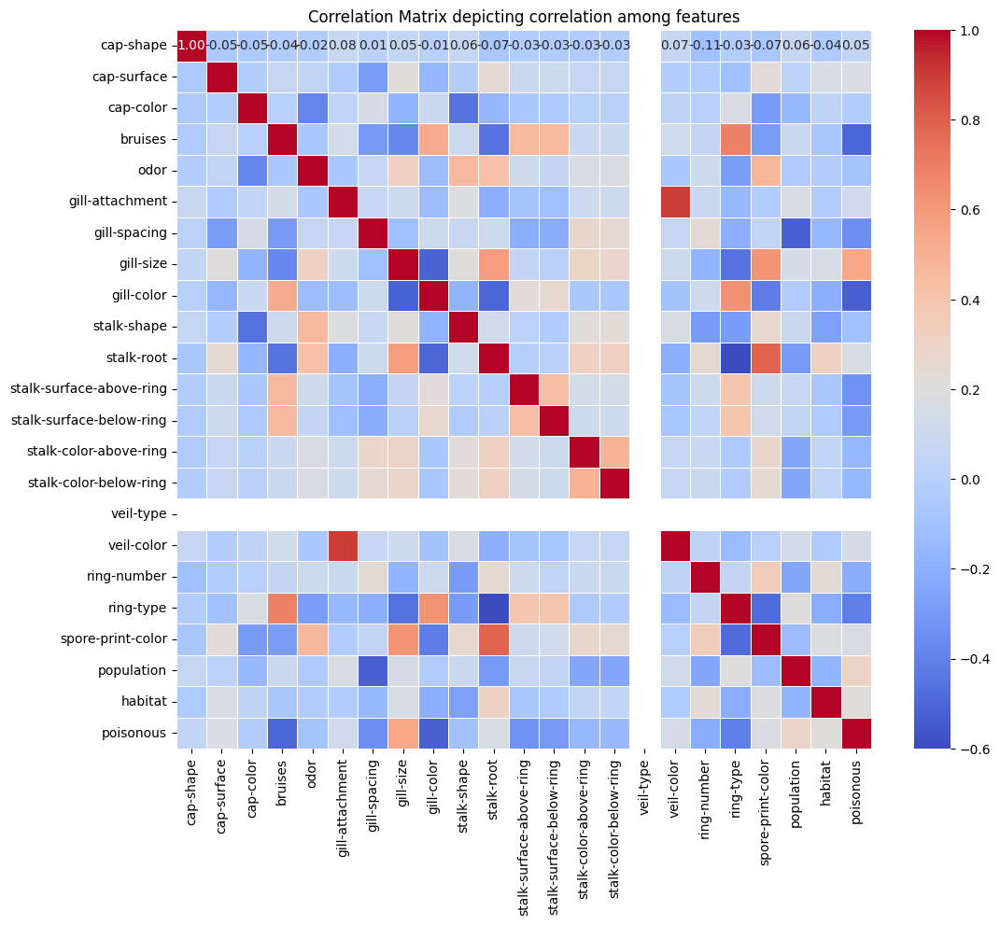

In [8]:
corr_matrix = df.corr()

# Создание тепловой карты корреляционной матрицы
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Correlation Matrix depicting correlation among features')
plt.show()

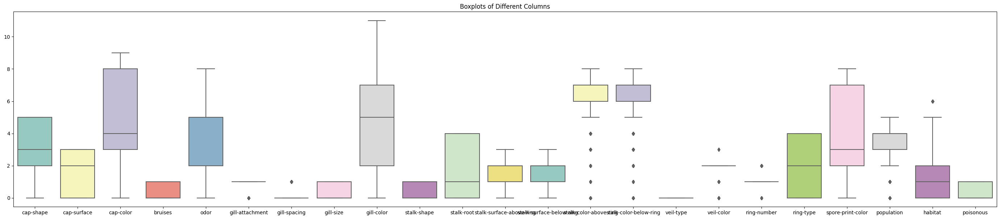

In [9]:
plt.figure(figsize=(35, 7))
sns.boxplot(data=df, palette="Set3")
plt.title('Boxplots of Different Columns')
plt.show()

In [10]:
df_one_hot = pd.concat([df.iloc[:,0], pd.get_dummies(df.iloc[:, 1:23])], axis=1)
features = df_one_hot.iloc[:, 1:118]
label = df_one_hot.iloc[:,0]
label = le.fit_transform(label)

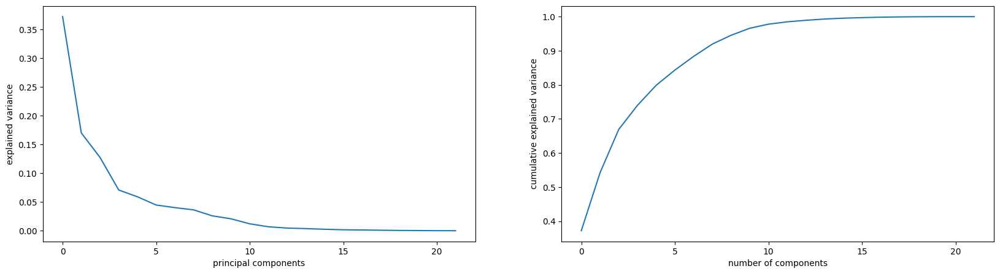

In [11]:
from sklearn. decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=123) #instant
pca.fit(features)
fig = plt.figure(figsize = (20,5))
ax = plt.subplot(121)
plt.plot(pca.explained_variance_ratio_) 
plt.xlabel('principal components')
plt.ylabel('explained variance')
ax2 = plt.subplot (122)
plt.plot(np.cumsum(pca.explained_variance_ratio_)) 
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

После 5-6 компонент, каждая следующая компонента объясняет значительно меньшую часть дисперсии.
Чтобы объяснить примерно 90% вариации в данных, достаточно использовать около 15 главных компонент.
Для дальнейшего анализа и построения моделей можно рассмотреть использование первых 5-10 компонент, так как они объясняют большую часть вариации данных, что позволяет значительно уменьшить размерность данных, сохраняя при этом большую часть информации.

In [12]:
from sklearn.model_selection import train_test_split
X = df.drop('poisonous', axis=1)
y = df['poisonous']
#y = y.replace(0,-1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Проверка размеров выборок
print(f'Размер обучающей выборки: {X_train.shape}')
print(f'Размер тестовой выборки: {X_test.shape}')
print(f'Размер целевой переменной для обучающей выборки: {y_train.shape}')
print(f'Размер целевой переменной для тестовой выборки: {y_test.shape}')


Размер обучающей выборки: (6499, 22)
Размер тестовой выборки: (1625, 22)
Размер целевой переменной для обучающей выборки: (6499,)
Размер целевой переменной для тестовой выборки: (1625,)


In [13]:
X_test2 = X_test

In [14]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve, auc, classification_report
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
import xgboost
from sklearn import tree
from sklearn import metrics

classifiers = []
lr_model= LogisticRegression()
classifiers.append(("Logistic Regression Classifier",lr_model))
dt_model = tree.DecisionTreeClassifier()
classifiers.append(("Decision Tree Classifier",dt_model))
rf_model = RandomForestClassifier()
classifiers.append(("Random Forest Classifier",rf_model))
xgb_model = xgboost.XGBClassifier()
classifiers.append(("XG Boost Classifier",xgb_model))
gp_model =  GaussianProcessClassifier()
classifiers.append(("Gaussian Process Classifier", gp_model))
ab_model =  AdaBoostClassifier()
classifiers.append(("AdaBoost Classifier", ab_model))
# Stores all the scores
cv_scores = []
names = []

for name, clf in classifiers:
    print(name)
    clf.fit(X_train, y_train)
    y_prob = clf.predict_proba(X_test)[:,1] # This will give you positive class prediction probabilities  
    y_pred = np.where(y_prob > 0.5, 1, 0) # This will threshold the probabilities to give class predictions.
    print("Model Score : ",clf.score(X_test, y_pred))
    print("Number of mislabeled points from %d points : %d"% (X_test.shape[0],(y_test!= y_pred).sum()))
    scores = cross_val_score(clf, features, label, cv=10, scoring='accuracy')
    cv_scores.append(scores)
    names.append(name)
    print("Cross validation scores : ",scores.mean())
    confusion_matrix=metrics.confusion_matrix(y_test,y_pred)
    print("Confusion Matrix \n",confusion_matrix)
    classification_report = metrics.classification_report(y_test,y_pred)
    print("Classification Report \n",classification_report)

Logistic Regression Classifier
Model Score :  1.0
Number of mislabeled points from 1625 points : 76


/Users/vladimirnikitin/miniconda3/envs/env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/vladimirnikitin/miniconda3/envs/env/lib/python3.11/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
/Users/vladimirnikitin/miniconda3/envs/env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number

Cross validation scores :  0.33306430601251824
Confusion Matrix 
 [[799  44]
 [ 32 750]]
Classification Report 
               precision    recall  f1-score   support

           0       0.96      0.95      0.95       843
           1       0.94      0.96      0.95       782

    accuracy                           0.95      1625
   macro avg       0.95      0.95      0.95      1625
weighted avg       0.95      0.95      0.95      1625

Decision Tree Classifier
Model Score :  1.0
Number of mislabeled points from 1625 points : 0
Cross validation scores :  0.13108462242257893
Confusion Matrix 
 [[843   0]
 [  0 782]]
Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       843
           1       1.00      1.00      1.00       782

    accuracy                           1.00      1625
   macro avg       1.00      1.00      1.00      1625
weighted avg       1.00      1.00      1.00      1625

Random Forest Classifier
Mo

/Users/vladimirnikitin/miniconda3/envs/env/lib/python3.11/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(


Cross validation scores :  0.13108462242257893
Confusion Matrix 
 [[843   0]
 [  0 782]]
Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       843
           1       1.00      1.00      1.00       782

    accuracy                           1.00      1625
   macro avg       1.00      1.00      1.00      1625
weighted avg       1.00      1.00      1.00      1625

XG Boost Classifier
Model Score :  1.0
Number of mislabeled points from 1625 points : 0


/Users/vladimirnikitin/miniconda3/envs/env/lib/python3.11/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(


Cross validation scores :  0.1757637588691158
Confusion Matrix 
 [[843   0]
 [  0 782]]
Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       843
           1       1.00      1.00      1.00       782

    accuracy                           1.00      1625
   macro avg       1.00      1.00      1.00      1625
weighted avg       1.00      1.00      1.00      1625

Gaussian Process Classifier


KeyboardInterrupt: 

In [15]:
import matplotlib.pyplot as plt


In [16]:
def confusion_matrix_elements(y_true, y_pred):
    TP = np.sum((y_true == 1) & (y_pred == 1))
    TN = np.sum((y_true == 0) & (y_pred == 0))
    FP = np.sum((y_true == 0) & (y_pred == 1))
    FN = np.sum((y_true == 1) & (y_pred == 0))
    return TP, TN, FP, FN

def accuracy(TP, TN, FP, FN):
    return (TP + TN) / (TP + TN + FP + FN)

def precision(TP, FP):
    return TP / (TP + FP) if TP + FP != 0 else 0

def recall(TP, FN):
    return TP / (TP + FN) if TP + FN != 0 else 0

def f1_score(precision, recall):
    return 2 * (precision * recall) / (precision + recall) if precision + recall != 0 else 0

def roc_curve_manual(y_true, y_prob):
    thresholds = np.linspace(0, 1, 101)
    tpr_list = []
    fpr_list = []
    
    for thresh in thresholds:
        y_pred = (y_prob >= thresh).astype(int)
        TP, TN, FP, FN = confusion_matrix_elements(y_true, y_pred)
        tpr = recall(TP, FN)
        fpr = FP / (FP + TN) if FP + TN != 0 else 0
        tpr_list.append(tpr)
        fpr_list.append(fpr)
    
    return np.array(fpr_list), np.array(tpr_list), thresholds

def auc_manual(fpr, tpr):
    sorted_indices = np.argsort(fpr)
    fpr_sorted = fpr[sorted_indices]
    tpr_sorted = tpr[sorted_indices]
    auc = np.trapz(tpr_sorted, fpr_sorted)
    return auc

In [43]:

# Функция активации сигмоида и ее производная
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return sigmoid(x) * (1 - sigmoid(x))

# Функция потерь (бинарная кросс-энтропия) и ее производная
# суть в том, чтобы посчитать насколько вероятно, что события произойдут на основе вероятностей - чем больше тем менее вероятно и наоборот
# или правильность составления вероятности отнесения бинарной классификации через сумму 
def binary_cross_entropy(y_true, y_pred):
    y_pred = np.clip(y_pred, 1e-15, 1 - 1e-15)
    return -np.mean(y_true * np.log(y_pred) + (1 - y_true) * np.log(y_pred))

def binary_cross_entropy_derivative(y_true, y_pred):
    y_pred = np.clip(y_pred, 1e-15, 1 - 1e-15)
    return (y_pred - y_true) / (y_pred * (1 - y_pred))

# Класс нейронной сети - имеем размеры входного слой, скрытых и оутпут в параметрах
# в конструкторе мы определяем скорость обучения и веса и сдвиг для связей между слоями
class NeuralNetwork:
    def __init__(self, input_size, hidden_layer_sizes, output_size, learning_rate=0.01):
        self.learning_rate = learning_rate
        self.weights1 = np.random.randn(input_size, hidden_layer_sizes[0]) * np.sqrt(2. / input_size)
        self.bias1 = np.zeros((1, hidden_layer_sizes[0]))
        self.weights2 = np.random.randn(hidden_layer_sizes[0], hidden_layer_sizes[1]) * np.sqrt(2. / hidden_layer_sizes[0])
        self.bias2 = np.zeros((1, hidden_layer_sizes[1]))
        self.weights3 = np.random.randn(hidden_layer_sizes[1], output_size) * np.sqrt(2. / hidden_layer_sizes[1])
        self.bias3 = np.zeros((1, output_size))
        
# Прямое распространение: вычисляем значения на первом скрытом слое как взвешенную сумму входных данных и весов слоя плюс сдвиг
# применяем активацию для моделировани далее вычисляем значения на слоях к активациям предыдущих применяем веса и сдвиги новых,
# выводим результат последнего применения
    #input - связи - hidden - связи - hidden - связи - выход
    
    def forward(self, X):
        self.z1 = np.dot(X, self.weights1) + self.bias1
        self.a1 = sigmoid(self.z1)
        self.z2 = np.dot(self.a1, self.weights2) + self.bias2
        self.a2 = sigmoid(self.z2)
        self.z3 = np.dot(self.a2, self.weights3) + self.bias3
        self.a3 = sigmoid(self.z3)
        return self.a3

# Обратное распространение: вычисляем ошибку на выходном слое как производную функции бинарной кросс-энтропии и дельту умножив
# ошибку на производную сигмоидной функции для z3, и тд до первого
    def backward(self, X, y, output):
        output_error = binary_cross_entropy_derivative(y, output)
        output_delta = output_error * sigmoid_derivative(self.z3)
        
        hidden2_error = output_delta.dot(self.weights3.T)
        hidden2_delta = hidden2_error * sigmoid_derivative(self.z2)
        
        hidden1_error = hidden2_delta.dot(self.weights2.T)
        hidden1_delta = hidden1_error * sigmoid_derivative(self.z1)

# Обновляем веса, умножив транспонированные активации скрытого слоя на дельту, обновляем сдвиги, суммируя дельту слоя
        self.weights3 -= self.learning_rate * self.a2.T.dot(output_delta)
        self.bias3 -= self.learning_rate * np.sum(output_delta, axis=0, keepdims=True)
        self.weights2 -= self.learning_rate * self.a1.T.dot(hidden2_delta)
        self.bias2 -= self.learning_rate * np.sum(hidden2_delta, axis=0, keepdims=True)
        self.weights1 -= self.learning_rate * X.T.dot(hidden1_delta)
        self.bias1 -= self.learning_rate * np.sum(hidden1_delta, axis=0, keepdims=True)

    def train(self, X, y, epochs, patience=500, tolerance=1e-1):
        best_loss = float('inf')
        patience_counter = 0
        
        for epoch in range(epochs):
            output = self.forward(X)
            self.backward(X, y, output)
            loss = binary_cross_entropy(y, output)
            
            if loss < best_loss - tolerance:
                best_loss = loss
                best_epoch = epoch
                patience_counter = 0
            else:
                patience_counter += 1
            
            if patience_counter >= patience:
                print(f"Early stopping on epoch {epoch}, loss = {loss}")
                print(f"Best loss & epoch {best_loss}, {best_epoch}")
                print
                break
            
            if epoch % 100 == 0:
                print(f"Epoch {epoch}, Loss: {loss}")

Epoch 0, Loss: 0.6148728644278809
Epoch 100, Loss: 0.9375248226710284
Epoch 200, Loss: 0.9535722406169348
Epoch 300, Loss: 1.1016432004837073
Epoch 400, Loss: 1.3479501944158874
Epoch 500, Loss: 1.6017446264979487
Epoch 600, Loss: 2.173985136906916
Early stopping on epoch 689, loss = 2.3901105274127654
Best loss & epoch 0.3770771580393541, 189
Accuracy: 0.9975
Precision: 0.9962
Recall: 0.9987
F1 Score: 0.9974


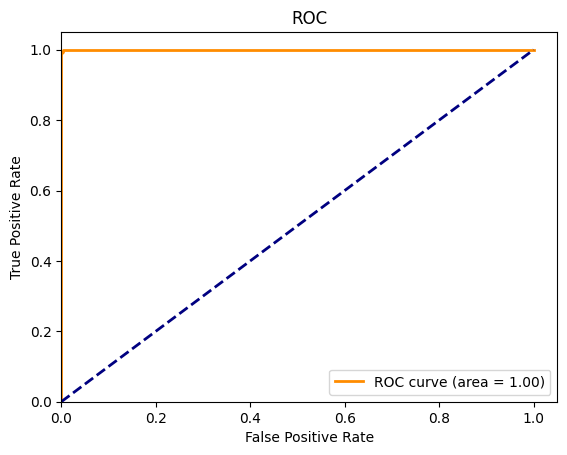

In [49]:
# Создание и обучение модели

nn = NeuralNetwork(input_size=22, hidden_layer_sizes=[11, 5], output_size=1, learning_rate=0.0001)
y_train = np.array(y_train).reshape(-1, 1)
y_test = np.array(y_test).reshape(-1, 1)

nn.train(X_train, y_train, epochs=10000)

# Предсказание и оценка
y_pred_prob = nn.forward(X_test)
y_pred = (y_pred_prob >= 0.5).astype(int)

# Вычисление элементов матрицы ошибок
TP, TN, FP, FN = confusion_matrix_elements(y_test, y_pred)

# Вычисление метрик
accuracy_value = accuracy(TP, TN, FP, FN)
precision_value = precision(TP, FP)
recall_value = recall(TP, FN)
f1_value = f1_score(precision_value, recall_value)

print(f"Accuracy: {accuracy_value:.4f}")
print(f"Precision: {precision_value:.4f}")
print(f"Recall: {recall_value:.4f}")
print(f"F1 Score: {f1_value:.4f}")

# Построение ROC-кривой вручную
fpr, tpr, thresholds = roc_curve_manual(y_test, y_pred_prob)
roc_auc = auc_manual(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()


Epoch 0, Loss: 0.9355714662622029
Epoch 100, Loss: 1.163083173848617


/var/folders/tx/zdp_82ms51z3z9bfb_zz54c80000gn/T/ipykernel_37356/303488937.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([''] + ['Predicted 0', 'Predicted 1'])
/var/folders/tx/zdp_82ms51z3z9bfb_zz54c80000gn/T/ipykernel_37356/303488937.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([''] + ['Actual 0', 'Actual 1'])


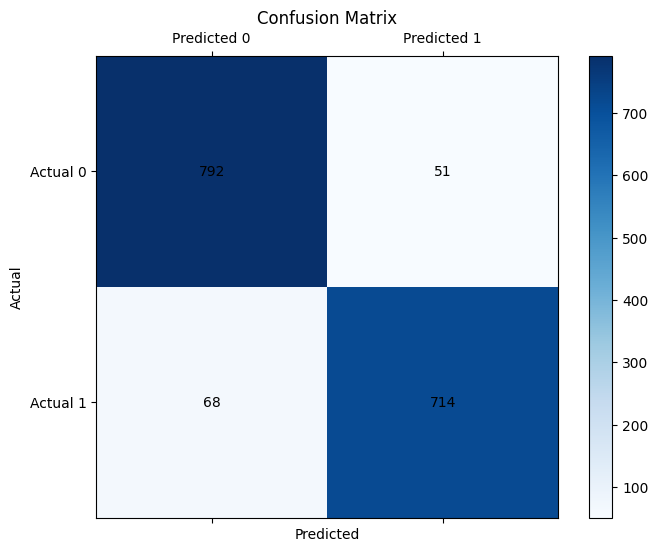

Accuracy: 0.9268
Precision: 0.9333
Recall: 0.9130
F1 Score: 0.9231


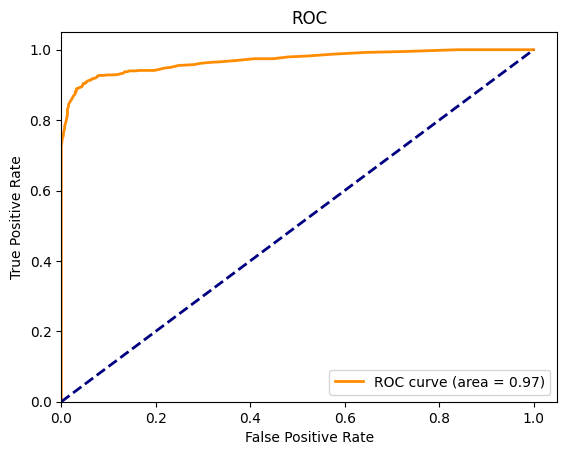

In [50]:
# Создание и обучение модели

nn = NeuralNetwork(input_size=22, hidden_layer_sizes=[11, 5], output_size=1, learning_rate=0.0001)
y_train = np.array(y_train).reshape(-1, 1)
y_test = np.array(y_test).reshape(-1, 1)

nn.train(X_train, y_train, epochs=189)

# Предсказание и оценка
y_pred_prob = nn.forward(X_test)
y_pred = (y_pred_prob >= 0.5).astype(int)

# Вычисление элементов матрицы ошибок
TP, TN, FP, FN = confusion_matrix_elements(y_test, y_pred)

# Создание матрицы ошибок
cm = np.array([[TN, FP],
               [FN, TP]])
# Визуализация матрицы ошибок с использованием Matplotlib
fig, ax = plt.subplots(figsize=(8, 6))
cax = ax.matshow(cm, cmap='Blues')
plt.title('Confusion Matrix')
fig.colorbar(cax)

# Установим метки осей
ax.set_xticklabels([''] + ['Predicted 0', 'Predicted 1'])
ax.set_yticklabels([''] + ['Actual 0', 'Actual 1'])

# Подпишем оси
plt.xlabel('Predicted')
plt.ylabel('Actual')

# Добавим значения на матрицу
for (i, j), val in np.ndenumerate(cm):
    ax.text(j, i, f'{val}', ha='center', va='center', color='black')

plt.show()

# Вычисление метрик
accuracy_value = accuracy(TP, TN, FP, FN)
precision_value = precision(TP, FP)
recall_value = recall(TP, FN)
f1_value = f1_score(precision_value, recall_value)

print(f"Accuracy: {accuracy_value:.4f}")
print(f"Precision: {precision_value:.4f}")
print(f"Recall: {recall_value:.4f}")
print(f"F1 Score: {f1_value:.4f}")

# Построение ROC-кривой вручную
fpr, tpr, thresholds = roc_curve_manual(y_test, y_pred_prob)
roc_auc = auc_manual(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()


In [ ]:
data = nn.forward(X_test)
y_pred = (data >= 0.5).astype(bool)
dfres = pd.DataFrame(data = X_test)
dfres.insert(0,'pred', data, True)
dfres.insert(1, 'verdict', y_pred, True)
dfres.insert(2,'true val',y_test, True)
dfres